In [44]:
import pandas as pd
import geopandas as gpd

import folium
import matplotlib.pyplot as plt
import contextily as ctx

In [19]:
sensor_status = pd.read_csv('../Traffic data/SCOOT/status.csv')
road = gpd.read_file('../Glasgow_road_link-shp/road_link_shp/20211110_glasgow_road_link.shp')
land_cover = gpd.read_file('../Land_cover/Land_cover_shp/land_cover_osgb36.shp')

### 1.Get sensors removed by zero & original sensors in GCC

In [33]:
removed_0 = sensor_status[(sensor_status['step 4']==1) & (sensor_status['step 5.2'] == 0)].iloc[:, :3]
original_gcc = sensor_status[(sensor_status['step 1']==1)].iloc[:, :3]

In [20]:
# Create a GeoDataFrame
def create_gdf(sensors_df):
    
    sensors_df["geometry"] = gpd.points_from_xy(sensors_df["longitude"], sensors_df["latitude"])
    # Set coordinate reference system
    sensors_gdf = gpd.GeoDataFrame(sensors_df, crs="epsg:4326")
    # Reproject
    sensors_gdf = sensors_gdf.to_crs("epsg:27700")
    
    return sensors_gdf

In [37]:
gdf_443 = create_gdf(removed_0)
gdf_971 = create_gdf(original_gcc)

### 2.Map the data

In [43]:
base_map = gdf_971.explore(color='navy', name='Original',tiles='cartodbpositron',width=750, height=500)
# Add another layer using the second GeoDataFrame
gdf_443.explore(m=base_map, color='pink', name='Removed')

# Add LayerControl to the map, allowing users to toggle between layers
folium.LayerControl().add_to(base_map)
base_map

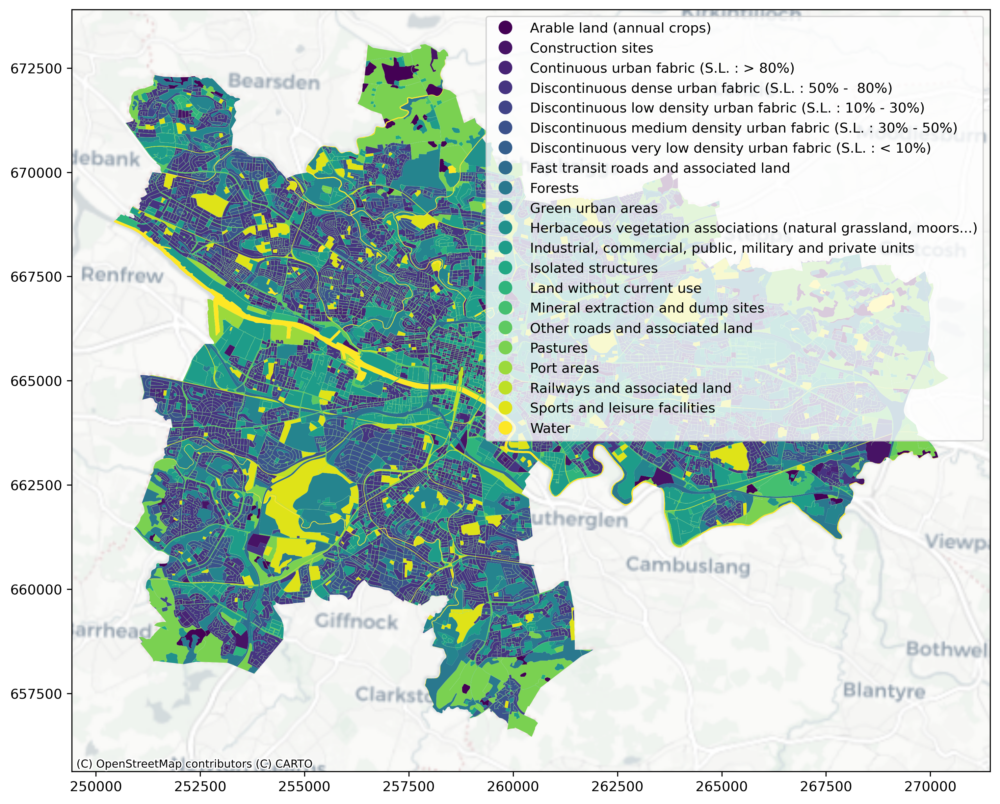

In [47]:
fig, ax = plt.subplots(figsize=(12,24), dpi=300) 
#Plot the data
land_cover.plot(column='class_2018', cmap='viridis', legend=True, ax=ax)
#Add basemap
ctx.add_basemap(ax, crs="EPSG:27700", source=ctx.providers.CartoDB.Positron)

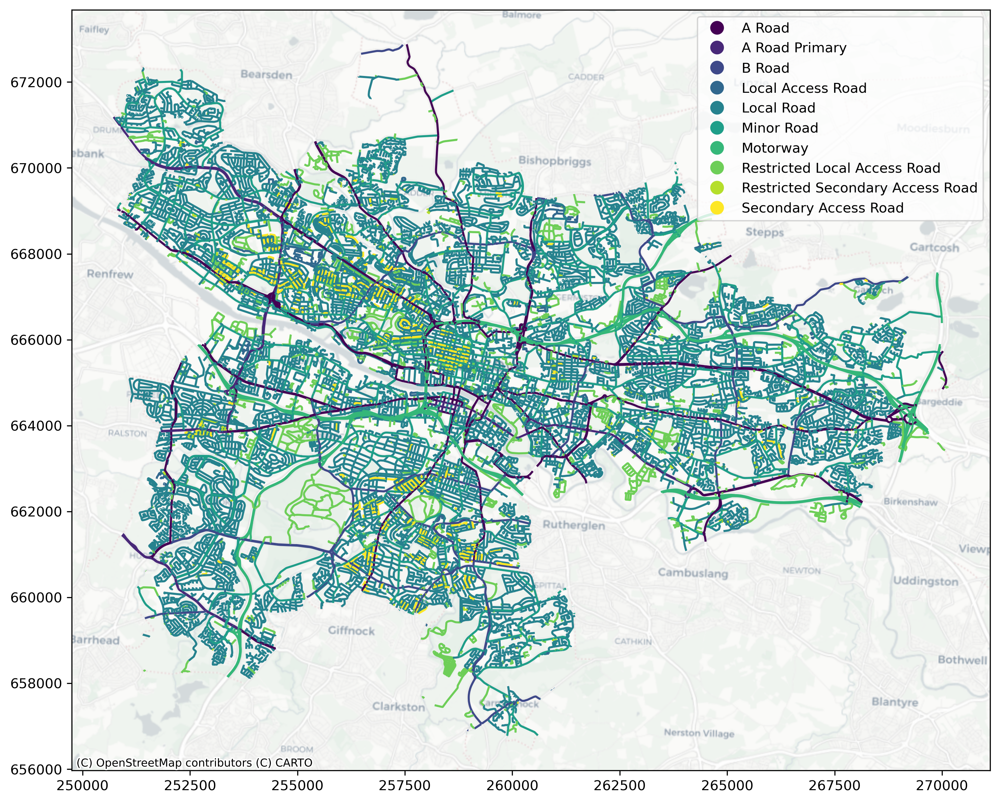

In [48]:
fig, ax = plt.subplots(figsize=(12,24), dpi=300) 
#Plot the data
road.plot(column='routeHiera', cmap='viridis', legend=True, ax=ax)
#Add basemap
ctx.add_basemap(ax, crs="EPSG:27700", source=ctx.providers.CartoDB.Positron)

### 3.Match land cover and road with sensors